#Exploratory Analysis of Iraq Conflict Data From 2019

###This notebook performs data cleaning and exploratory analysis of ACLED conflict data in Iraq, 2019. The goal of this notebook is to identify and visualize keys statistics that may be informative for military or foreign policy analysts dealing with the conflict in Iraq. 



In [195]:
#@title

!pip install geopandas

import requests
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import matplotlib as mpl
import datetime as dt
plt.style.use('ggplot')


In [196]:
#@title
conflict_df=pd.read_csv('https://raw.githubusercontent.com/ConnerBrew/Iraq-Conflict-Data/master/conflict_data_irq.csv')
conflict_df=conflict_df.loc[conflict_df['year'] == '2019']

First, I trimmed the ACLED dataset to only include data from Iraq in 2019. The initial dataset displays a large amount of conflict data from various years and locations, much of which was irrelevant for this analysis. The first step was to generate a small table that allowed me to get a grasp of the data I would be working with. Below the table is metadata information about the counts of values within columns as well as the data types for each column, which gave me the information I needed to clean the dataset for further analysis. 

In [197]:
#@title
print(conflict_df.shape)
conflict_df.head()

(3469, 31)


,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
2316,6708242.0,368.0,IRQ22736,22736.0,2019-12-31,2019,1.0,Protests,Peaceful protest,Protesters (Iraq),NaN,6.0,NaN,NaN,0.0,60.0,Middle East,Iraq,Basrah,Al-Qurna,NaN,Qurna,31.0167,47.4333,1.0,Al Mirbad,National,"On Dec 31, protesters in Qurna came out to den...",0,1.578504e+09,IRQ
2317,6708268.0,368.0,IRQ22734,22734.0,2019-12-31,2019,1.0,Protests,Peaceful protest,Protesters (Iraq),Students (Iraq),6.0,NaN,NaN,0.0,60.0,Middle East,Iraq,Basrah,Basrah,NaN,Basrah,30.5330,47.7975,1.0,Al Mirbad,National,"On Dec 31, a number of college students at the...",0,1.578504e+09,IRQ
2318,6708285.0,368.0,IRQ22724,22724.0,2019-12-31,2019,1.0,Protests,Peaceful protest,Protesters (Iraq),Labour Group (Iraq),6.0,NaN,NaN,0.0,60.0,Middle East,Iraq,Muthanna,As Samawah,NaN,As Samawah,31.3059,45.2799,3.0,Al Mirbad,National,"On Dec 31, labour groups working in al-Muthann...",0,1.578504e+09,IRQ
2319,6708287.0,368.0,IRQ22726,22726.0,2019-12-31,2019,1.0,Protests,Peaceful protest,Protesters (Iraq),NaN,6.0,NaN,NaN,0.0,60.0,Middle East,Iraq,Najaf,Najaf,NaN,Najaf,32.0259,44.3462,1.0,Al Mirbad,National,"On Dec 31, protesters in Najaf city demanded t...",0,1.578504e+09,IRQ
2320,6708293.0,368.0,IRQ22732,22732.0,2019-12-31,2019,1.0,Protests,Peaceful protest,Protesters (Iraq),NaN,6.0,NaN,NaN,0.0,60.0,Middle East,Iraq,Thi-Qar,Nassriya,NaN,Nassriya,31.0580,46.2573,1.0,Al Mirbad,National,"On Dec 31, dozens of relatives of martyrs prot...",0,1.578504e+09,IRQ


In [198]:
#@title
for column in conflict_df.columns: 
  print(conflict_df[column].value_counts())

6335203.0    1
6330307.0    1
7098018.0    1
7098091.0    1
5155745.0    1
            ..
6708323.0    1
7125861.0    1
5218658.0    1
7097227.0    1
7098174.0    1
Name: data_id, Length: 3469, dtype: int64
368.0    3469
Name: iso, dtype: int64
IRQ21508    1
IRQ19159    1
IRQ21257    1
IRQ21941    1
IRQ21202    1
           ..
IRQ21909    1
IRQ20153    1
IRQ19142    1
IRQ21940    1
IRQ20146    1
Name: event_id_cnty, Length: 3469, dtype: int64
22023.0    1
20561.0    1
21008.0    1
15036.0    1
21808.0    1
          ..
22698.0    1
20311.0    1
14869.0    1
20091.0    1
22784.0    1
Name: event_id_no_cnty, Length: 3469, dtype: int64
2019-12-22    35
2019-11-04    32
2019-11-24    30
2019-10-02    29
2019-11-20    27
              ..
2019-03-26     2
2019-09-29     2
2019-01-15     2
2019-01-04     1
2019-05-10     1
Name: event_date, Length: 365, dtype: int64
2019    3469
Name: year, dtype: int64
1.0    2905
2.0     564
Name: time_precision, dtype: int64
Explosions/Remote violence    1

In [199]:
#@title
conflict_df=conflict_df.drop(columns=['iso','event_id_cnty','event_id_no_cnty','year','time_precision','region','country','timestamp','geo_precision','iso3'],axis=1)
conflict_df=conflict_df.loc[conflict_df['event_type'] != 'Strategic developments']
conflict_df=conflict_df.loc[conflict_df['event_type'] != 'Protests']

In [200]:
#@title
float_columns=conflict_df[['latitude','longitude','fatalities','inter1','inter2','interaction','fatalities']]
cat_columns=conflict_df[['event_type','sub_event_type','actor1','assoc_actor_1','actor2','assoc_actor_2','admin1','admin2','admin3','location','source','source_scale']]

for column in float_columns:
  conflict_df[column]=conflict_df[column].astype('float64')

for column in cat_columns:
  conflict_df[column]=conflict_df[column].astype('category')

conflict_df['event_date']=pd.to_datetime(conflict_df['event_date'])

In [201]:
#@title
conflict_df.dtypes

data_id                  float64
event_date        datetime64[ns]
event_type              category
sub_event_type          category
actor1                  category
assoc_actor_1           category
inter1                   float64
actor2                  category
assoc_actor_2           category
inter2                   float64
interaction              float64
admin1                  category
admin2                  category
admin3                  category
location                category
latitude                 float64
longitude                float64
source                  category
source_scale            category
notes                     object
fatalities               float64
dtype: object

The first metric is the total amount of conflict events by category. This graphic only shows violent events such as battles, explosions, and riots. Peaceful conflict events such as political summits were removed from the dataset - that is because the purpose of this analysis is to identify correlates of violence in Iraq. As the chart below depicts, explosions and remote violence make up the vast majority of violent events. This category includes use of weapons such as IEDs. 

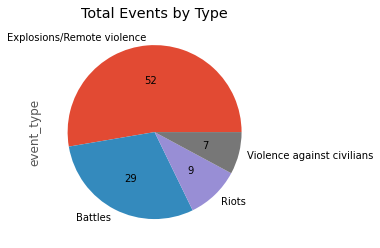

In [202]:
#@title
conflict_df['event_type'].value_counts().plot.pie(autopct='%d',title='Total Events by Type')

In [203]:
#@title
conflict_df['actors']= conflict_df['actor1'].str.cat(conflict_df['actor2'], sep =',') 
conflict_df['actors'].value_counts()

Military Forces of Turkey (2016-),PKK: Kurdistan Workers Party    552
Unidentified Armed Group (Iraq),Civilians (Iraq)                  242
Military Forces of Iraq (2018-2020),Islamic State (Iraq)          193
Islamic State (Iraq),Civilians (Iraq)                             140
Rioters (Iraq),Police Forces of Iraq (2018-2020)                  138
                                                                 ... 
Islamic State (Iraq),Al Mukhaysah Communal Militia (Iraq)           1
TMF: Tribal Mobilization Forces,Civilians (Iraq)                    1
PKK: Kurdistan Workers Party,Civilians (Iraq)                       1
Islamic State (Iraq),PKK: Kurdistan Workers Party                   1
Rioters (Iraq),Police Forces of Iraq (2018-2020) Asayish            1
Name: actors, Length: 103, dtype: int64

The ACLED dataset tracks participants in conflict events. To view the most common pairings of participants, I merged participant columns together and charted them by total events. The most common pairing was that of Turkish Military Forces and the PKK, indicating that Turkish incursions into northern Iraq made up a substantial amount of conflict activity in the country in 2019. 

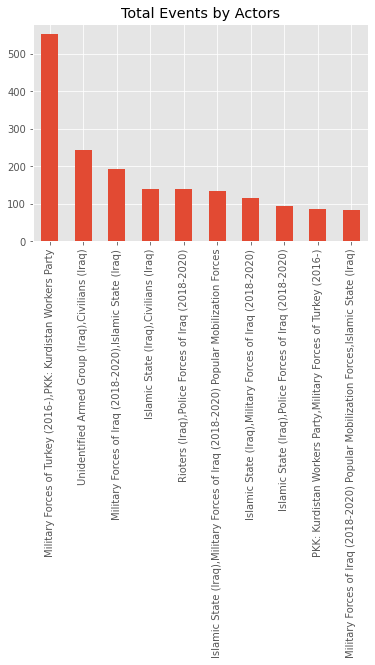

In [204]:
#@title
conflict_df['actors'].value_counts().head(10).plot.bar(title='Total Events by Actors')

The People's Defense Forces, a Kurdish government organization, is the most common reporter of conflict data - this aligns with the majority of events being conducted between Kurdish and TURMIL forces. Following that, the expected large Iraqi national news agencies account for most reporting. 

The takeaway from this is that, for a foreign policy or open source intelligence analyst, official reports from the People's Defense Agency or reporting from the Iraqi News Agency may provide the most comprehensive coverage of the Iraqi conflict. 

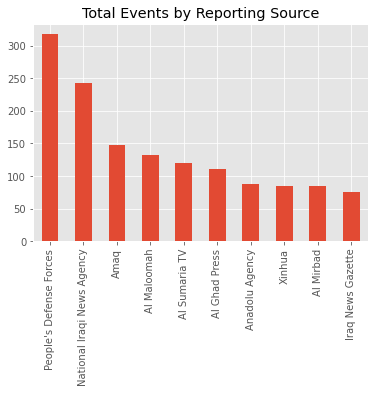

In [205]:
#@title
conflict_df['source'].value_counts().head(10).plot.bar(title='Total Events by Reporting Source')

The ACLED codebook at https://www.acleddata.com/wp-content/uploads/2015/01/ACLED_Codebook_2015.pdf defines the relationship between conflict actors in a two-digit number, as seen in the below histogram. We can see that the bulk of the events were categorized as Military actions against civilians, rebels, or protestors as evidenced by the peak in the 10-15 range. In the 25-30 range, we see a high number of events that are Rebels acting against other actors, such as civilians. Finally, the 45-50 range indicates events in which communal militias engaged other actors - in this case, very likely the Popular Mobilization Committee. The 75-80 range contains 'other' or 'unknown' actors. 

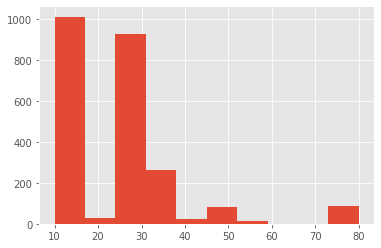

In [206]:
#@title
conflict_df['interaction'].hist()

In [207]:
#@title
conflict_df['day_of_week'] = conflict_df['event_date'].dt.day_name()

In [208]:
#@title
actor_data=pd.DataFrame(conflict_df.groupby('actors').fatalities.mean().nlargest(5))
district_data=pd.DataFrame(conflict_df.groupby('admin2').fatalities.mean().nlargest(5))
province_data=pd.DataFrame(conflict_df.groupby('admin1').fatalities.mean())
event_data=pd.DataFrame(conflict_df.groupby('event_type').fatalities.mean())
day_data=pd.DataFrame(conflict_df.groupby('day_of_week').fatalities.mean())




The next several charts depict average number of fatalities grouped by various metrics such as actor pairings, province, and district. The goal of this visualization is to identify potential correlates that may indicate increased or decreased fatalities. 

Interestingly, above visualizations showed that Explosions were the most common event type by a large margin. However, the average number of fatalities for explosions is much lower than that of other event categories such as Battles.
 
Comparing the event type metric to the Incident Actors metric, we can see that battles occurring between US military forces and Iraqi Popular Mobilization Forces are the most likely events to generate high numbers of fatalities. 

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Text(0.5, 1.0, 'Average Fatalities by Day of Week')

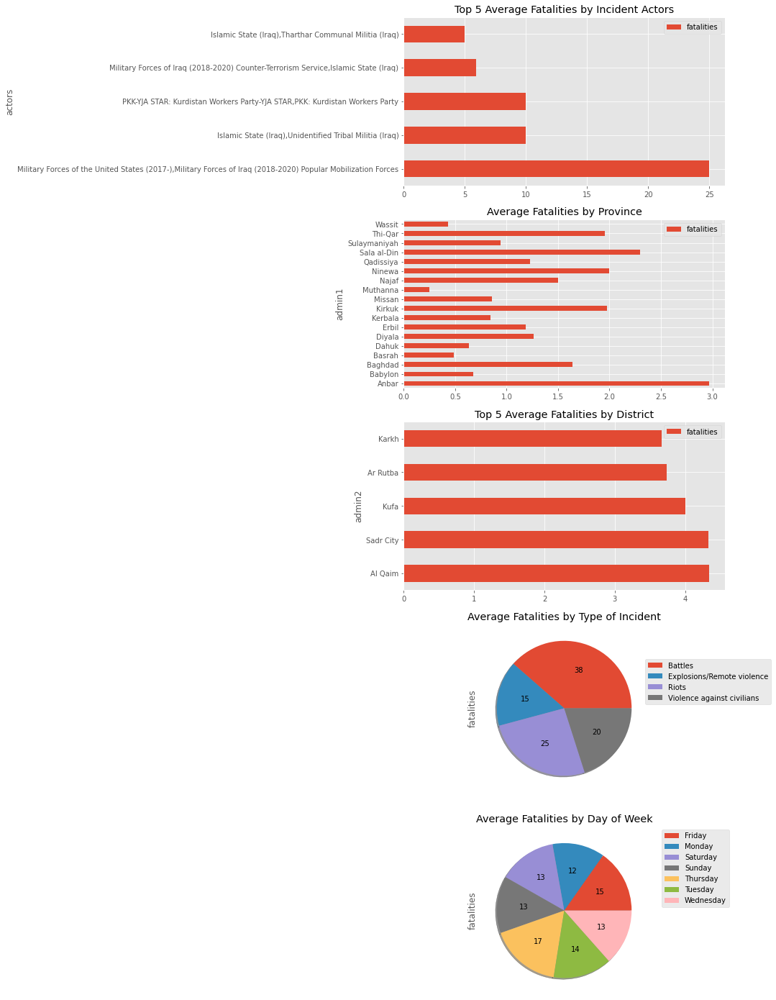

In [209]:
#@title
figure,axes=plt.subplots(nrows=5,ncols=1,figsize=(8,25))
actor_data.plot.barh(ax=axes[0],subplots='True')
axes[0].set_title('Top 5 Average Fatalities by Incident Actors')
province_data.plot.barh(ax=axes[1],subplots='True')
axes[1].set_title('Average Fatalities by Province')
district_data.plot.barh(ax=axes[2],subplots='True')
axes[2].set_title('Top 5 Average Fatalities by District')
event_data.plot.pie(ax=axes[3],subplots='True',labels=None,autopct='%d',shadow=True)
axes[3].legend(loc=4, bbox_to_anchor=(1.75,0.5),labels=event_data.index)
axes[3].set_title('Average Fatalities by Type of Incident')
day_data.plot.pie(ax=axes[4],subplots='True',labels=None,autopct='%d',shadow=True)
axes[4].legend(loc=4, bbox_to_anchor=(1.5,0.5),labels=day_data.index)
axes[4].set_title('Average Fatalities by Day of Week')


For the final visualization, we examine total number of events throughout the year compared to total number of fatalities. Analysts may benefit from the knowledge that there is a clear peak in violent activity over the summer months from April - August. Additionally, there was a very large peak in violent activity in October and November of 2019. This coincides with the large anti-government protest movement that exploded in Iraq in October 2019 and did not subside until the advent of Novel Coronavirus in early 2020. 

Text(0.5, 1.0, 'Total Fatalities by Month')

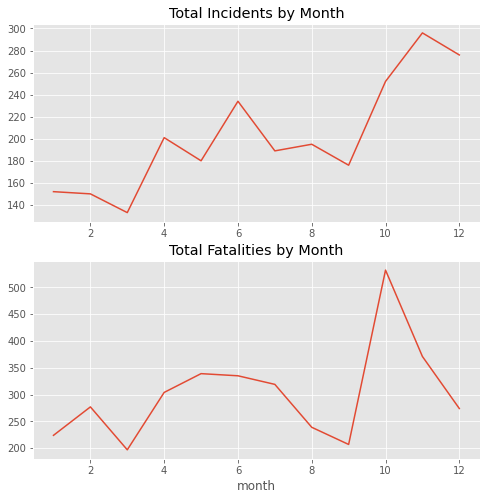

In [210]:
#@title
conflict_df['month']=conflict_df['event_date'].dt.month
month_totals=conflict_df['month'].value_counts().sort_index()
month_fatalities=conflict_df.groupby('month').fatalities.sum()

figure,axes=plt.subplots(nrows=2,ncols=1,figsize=(8,8))

month_totals.plot.line(ax=axes[0])
axes[0].set_title('Total Incidents by Month')
month_fatalities.plot.line(ax=axes[1])
axes[1].set_title('Total Fatalities by Month')

In [211]:
#@title
!pip install folium 
import folium 
import matplotlib.cm as cm
import matplotlib.colors as colors

In [212]:
#@title
map=folium.Map(location=[33.22,43.67],zoom_start=5)

In [228]:
#@title
cluster_df=conflict_df.drop(conflict_df.columns.difference(['latitude','longitude']), 1)
cluster_df['latitude']=cluster_df['latitude'].astype(int)
cluster_df['longitude']=cluster_df['longitude'].astype(int)
x=cluster_df.values
dim0 = x.shape[0]
dim1 = x.shape[1]
print(dim0,",",dim1)

2434 , 2


The next step for visual analysis was to spatially cluster the conflict data. To do this, I chose to use a DBSCAN algorithm. The below chart depicts k-distance metrics for the lat/lons of conflict events, allowing optimization of the epsilon parameter for DBSCAN clustering. 

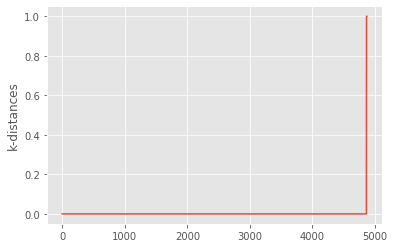

In [229]:
#@title
def k_distances2(x, k):
    p=-2*x.dot(x.T)+np.sum(x**2, axis=1).T+ np.repeat(np.sum(x**2, axis=1),dim0,axis=0).reshape(dim0,dim0)
    p = np.sqrt(p)
    p.sort(axis=1)
    p=p[:,:k]
    pm= p.flatten()
    pm= np.sort(pm)
    return p, pm
m, m2= k_distances2(x, 2)
plt.plot(m2)
plt.ylabel("k-distances")
plt.grid(True)
plt.show()

In [236]:
#@title
from sklearn.cluster import DBSCAN
import numpy as np

clustering = DBSCAN(eps=0.01, min_samples=5)

clustering.fit(x)
conflict_df['Cluster Labels']=clustering.fit_predict(x)
kclusters=conflict_df['Cluster Labels'].nunique()

In [240]:
#@title
import matplotlib.cm as cm
import matplotlib.colors as colors

markers_colors = []

X = np.arange(kclusters)
ys = [i + X + (i*X)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for lat,lng,notes,cluster in zip(conflict_df['latitude'],conflict_df['longitude'],conflict_df['notes'],conflict_df['Cluster Labels']):
  folium.vector_layers.CircleMarker(
        [lat,lng],
        radius=5,
        popup='Cluster Number:{}. Event Description: {}'.format(cluster,notes),
        color='black',
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1,
        parse_html=False).add_to(map)


The following map depicts all the conflict events from 2019 color-coded by spatial cluster. The DBSCAN algorithm revealed 29 clusters as well as an outlier cluster (represented by cluster number -1) for a total of 30 clusters. This information is valuable for military intelligence analysts who can use clusters as a method for focusing analytic energy. A common problem on analytic watchfloors is difficulty in choosing how to divide focus and attention; this map allows an easy method for doing this. 

Additionally, events within the same cluster likely share commonalities in actor participation and political challenges. For example, Cluster Number 23 located on the Ninawa Province/Syria border features multiple incidents of Islamic State attacks on the civilian population. It is very likely that the Islamic State attacks carried out within cluster 23 were conducted by the same network of insurgents. Therefore, this information can be used for attributing violent activities to specific groups of individuals based on spatial proximity. 

In [241]:
#@title
map